# Modelo de Regresión para Series de Tiempo con Imágenes


#### Este trabajo surge como el estudio previo a la creación del modelo final de mi **TFG**.

#### Mi **TFG** consiste en desarrollar un modelo **Imitation Learning** o **Behavior Cloninig** apoyado con **Dagger** dentro de un videojuego

####  **Imitation Learning** o **Behavior Cloninig** consiste en un conjunto de técnicas relacionadas con Reinforcement Learning, donde mediante muestras de un experto un humano, la inteligencia artificial aprende a realizar una acción.

#### En el caso de mi TFG, se trataba de enseñar a una inteligencia artificial a jugar de forma autónoma a un videojuego.

#### Para esto, al entrenar el modelo, necesité utilizar series de tiempo, ya que mi dataset estaba compuesto por:


*   5 imágenes en formato de frames del mapa.
*   5 imágenes en formato de frames de lo que veía el jugador.
*   Una lista que representa el movimiento del personaje con el ratón.

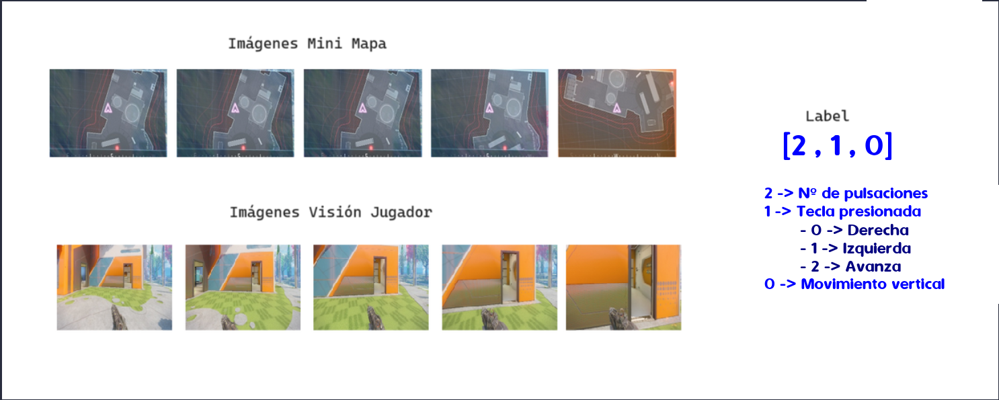

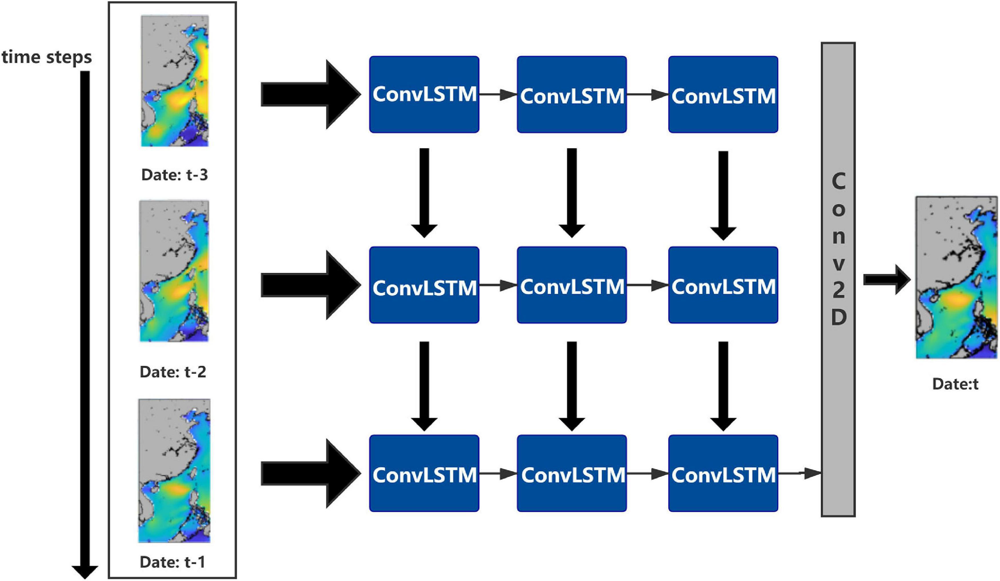

# Resumen del Notebook
#### Para ello, después de recolectar suficientes muestras para crear el modelo, comencé su desarrollo.

#### En este notebook se lleva a cabo:


*   Estudio del Conjunto de Datos
*   Preprocesamiento tanto de las imágenes como de la variable a predecir
*   Preprocesamiento con herramientas como MinMaxScaler o estructuras de normalización
*   Creación de una estructura de batches personalizada para este problema
*   Creacion de modelo de Serie de Tiempo
*   Optimización del modelo
*   Estudio de los resultados Obtenidos

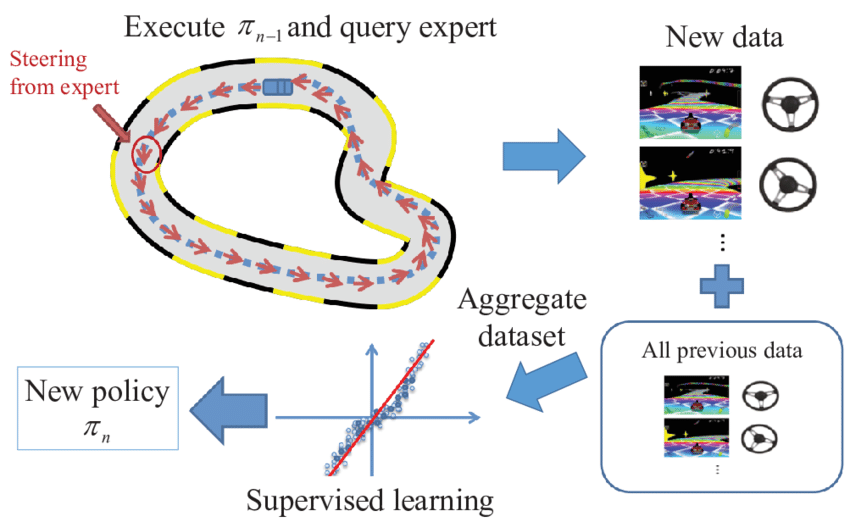

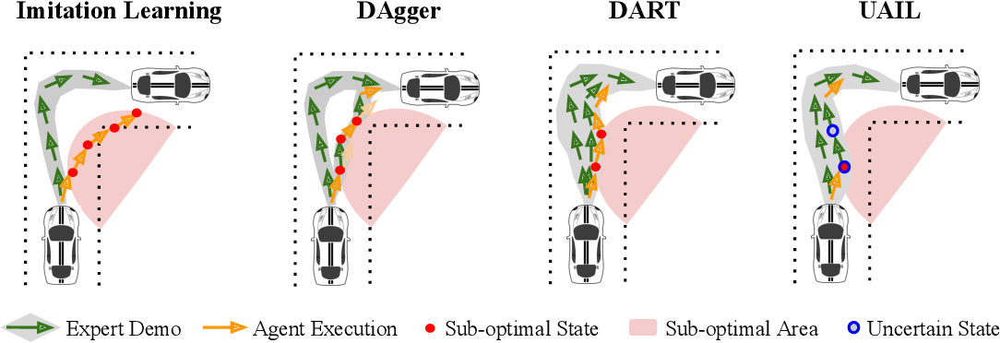

In [2]:
from google.colab import drive
import os
import zipfile

drive.mount('/content/drive')

if os.path.exists('drive/MyDrive/cod.zip'):
    print("La ruta existe")
else:
    print("La ruta no existe")

Mounted at /content/drive
La ruta existe


In [3]:
with zipfile.ZipFile('drive/MyDrive/cod.zip', 'r') as zip_ref:
    zip_ref.extractall('cod')

print("El directorio actual es:", os.getcwd())

El directorio actual es: /content


In [1]:
import numpy as np
import pandas as pd
import cv2
from PIL import Image, ImageEnhance ,ImageFilter
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import os
#os.environ['TF_GPU_ALLOCATOR'] = 'cuda_malloc_async'

In [2]:
import tensorflow as tf

2024-07-13 07:45:38.820549: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-07-13 07:45:40.952913: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX512F AVX512_VNNI AVX512_BF16, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
# Configurar TensorFlow para permitir el crecimiento de la memoria de la GPU
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

2024-07-10 12:51:07.154439: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-07-10 12:51:07.907338: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-07-10 12:51:07.907586: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

In [3]:
# Verificar dispositivos disponibles
if tf.test.gpu_device_name():
    print('GPU encontrada:', tf.test.gpu_device_name())
else:
    print("No se encontró GPU. Se utilizará la CPU.")

GPU encontrada: /device:GPU:0


2024-07-11 15:12:54.351889: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-07-11 15:12:54.381138: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-07-11 15:12:54.381339: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

In [6]:
os.chdir("cod/modelos")

In [2]:
os.getcwd()

'/media/recesvinto/3640d90a-b4df-40aa-a056-59c4e0eef6fd/TFG/TFG_Imitation_learning/modelos'

In [ ]:
df_mini = pd.read_csv('../datos/grabacion/datos_bo3_minimapa_03.csv')
df_pov = pd.read_csv('../datos/grabacion/datos_bo3_pov_03.csv')

In [2]:
df_mini = pd.read_csv('../datos/grabacion/datos_subway_mini.csv')
df_pov = pd.read_csv('../datos/grabacion/datos_subway_pov.csv')

In [4]:
df_mini

,mini_01,mini_02,mini_03,mini_04,mini_05,mouse_final
0,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,"[1, 1, 0]"
1,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,"[1, 1, 0]"
2,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,"[1, 2, 0]"
3,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,"[1, 1, 0]"
4,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,datos/grabacion/mini_mapa/mini_mapa_08-18-27-4...,"[1, 2, 0]"
...,...,...,...,...,...,...
77645,datos/grabacion/mini_mapa/mini_mapa_09-10-14-0...,datos/grabacion/mini_mapa/mini_mapa_09-10-14-0...,datos/grabacion/mini_mapa/mini_mapa_09-10-14-0...,datos/grabacion/mini_mapa/mini_mapa_09-10-14-0...,datos/grabacion/mini_mapa/mini_mapa_09-10-14-0...,"[1, 1, 0]"
77646,datos/grabacion/mini_mapa/mini_mapa_09-10-14-0...,datos/grabacion/mini_mapa/mini_mapa_09-10-14-0...,datos/grabacion/mini_mapa/mini_mapa_09-10-14-0...,datos/grabacion/mini_mapa/mini_mapa_09-10-14-0...,datos/grabacion/mini_mapa/mini_mapa_09-10-14-0...,"[1, 3, 0]"
77647,datos/grabacion/mini_mapa/mini_mapa_09-10-14-1...,datos/grabacion/mini_mapa/mini_mapa_09-10-14-1...,datos/grabacion/mini_mapa/mini_mapa_09-10-14-1...,datos/grabacion/mini_mapa/mini_mapa_09-10-14-1...,datos/grabacion/mini_mapa/mini_mapa_09-10-14-1...,"[1, 2, 0]"
77648,datos/grabacion/mini_mapa/mini_mapa_09-10-14-1...,datos/grabacion/mini_mapa/mini_mapa_09-10-14-1...,datos/grabacion/mini_mapa/mini_mapa_09-10-14-1...,datos/grabacion/mini_mapa/mini_mapa_09-10-14-1...,datos/grabacion/mini_mapa/mini_mapa_09-10-14-1...,"[1, 3, 0]"


In [5]:
df_pov

,pov_01,pov_02,pov_03,pov_04,pov_05,mouse_final
0,datos/grabacion/pov/pov_08-18-27-44-718379.jpg,datos/grabacion/pov/pov_08-18-27-44-840329.jpg,datos/grabacion/pov/pov_08-18-27-44-961117.jpg,datos/grabacion/pov/pov_08-18-27-45-077859.jpg,datos/grabacion/pov/pov_08-18-27-45-197491.jpg,"[1, 1, 0]"
1,datos/grabacion/pov/pov_08-18-27-44-718379.jpg,datos/grabacion/pov/pov_08-18-27-44-840329.jpg,datos/grabacion/pov/pov_08-18-27-44-961117.jpg,datos/grabacion/pov/pov_08-18-27-45-077859.jpg,datos/grabacion/pov/pov_08-18-27-45-197491.jpg,"[1, 1, 0]"
2,datos/grabacion/pov/pov_08-18-27-46-323346.jpg,datos/grabacion/pov/pov_08-18-27-46-443694.jpg,datos/grabacion/pov/pov_08-18-27-46-560236.jpg,datos/grabacion/pov/pov_08-18-27-46-678383.jpg,datos/grabacion/pov/pov_08-18-27-46-796428.jpg,"[1, 2, 0]"
3,datos/grabacion/pov/pov_08-18-27-44-718379.jpg,datos/grabacion/pov/pov_08-18-27-44-840329.jpg,datos/grabacion/pov/pov_08-18-27-44-961117.jpg,datos/grabacion/pov/pov_08-18-27-45-077859.jpg,datos/grabacion/pov/pov_08-18-27-45-197491.jpg,"[1, 1, 0]"
4,datos/grabacion/pov/pov_08-18-27-46-323346.jpg,datos/grabacion/pov/pov_08-18-27-46-443694.jpg,datos/grabacion/pov/pov_08-18-27-46-560236.jpg,datos/grabacion/pov/pov_08-18-27-46-678383.jpg,datos/grabacion/pov/pov_08-18-27-46-796428.jpg,"[1, 2, 0]"
...,...,...,...,...,...,...
77645,datos/grabacion/pov/pov_09-10-14-06-822724.jpg,datos/grabacion/pov/pov_09-10-14-06-941432.jpg,datos/grabacion/pov/pov_09-10-14-07-072926.jpg,datos/grabacion/pov/pov_09-10-14-07-191482.jpg,datos/grabacion/pov/pov_09-10-14-07-311442.jpg,"[1, 1, 0]"
77646,datos/grabacion/pov/pov_09-10-14-08-438469.jpg,datos/grabacion/pov/pov_09-10-14-08-557175.jpg,datos/grabacion/pov/pov_09-10-14-08-691442.jpg,datos/grabacion/pov/pov_09-10-14-08-824347.jpg,datos/grabacion/pov/pov_09-10-14-08-943993.jpg,"[1, 3, 0]"
77647,datos/grabacion/pov/pov_09-10-14-10-073058.jpg,datos/grabacion/pov/pov_09-10-14-10-191212.jpg,datos/grabacion/pov/pov_09-10-14-10-310500.jpg,datos/grabacion/pov/pov_09-10-14-10-440316.jpg,datos/grabacion/pov/pov_09-10-14-10-564991.jpg,"[1, 2, 0]"
77648,datos/grabacion/pov/pov_09-10-14-11-698863.jpg,datos/grabacion/pov/pov_09-10-14-11-830378.jpg,datos/grabacion/pov/pov_09-10-14-11-976363.jpg,datos/grabacion/pov/pov_09-10-14-12-124246.jpg,datos/grabacion/pov/pov_09-10-14-12-262375.jpg,"[1, 3, 0]"


## Preproceso del Conjunto de los Datos

In [3]:
import ast

#Eliminamos duplicados
df_mini.drop_duplicates(inplace=True)
df_pov.drop_duplicates(inplace=True)

# Restablecer el índice
df_mini.reset_index(drop=True, inplace=True)
df_pov.reset_index(drop=True, inplace=True)

# Convertir la columna de tipo object a listas de enteros
df_mini['mouse_final'] = df_mini['mouse_final'].apply(ast.literal_eval)
df_pov['mouse_final'] = df_pov['mouse_final'].apply(ast.literal_eval)

In [5]:
# Filtrar las filas donde 'mouse_final' sea igual a [0, 0]
#filtro = df_mini['mouse_final'].apply(lambda x: x[0] == 2 or x[0] == 3)
filtro = df_mini['mouse_final'].apply(lambda x: x[1] == 3)
# Eliminar las filas que cumplen con la condición
df_mini = df_mini[~filtro]

# Filtrar las filas donde 'mouse_final' sea igual a [0, 0]
#filtro = df_pov['mouse_final'].apply(lambda x: x[0] == 2 or x[0] == 3)
filtro = df_pov['mouse_final'].apply(lambda x: x[1] == 3)
# Eliminar las filas que cumplen con la condición
df_pov = df_pov[~filtro]

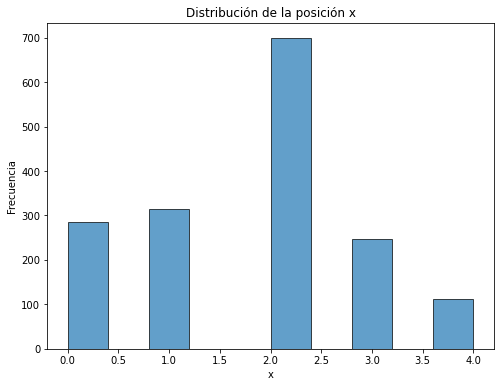

In [4]:
# Extraer la primera posición sin modificar el DataFrame
x_positions = df_mini['mouse_final'].apply(lambda x: x[1])

# Crear la figura y el eje
fig, ax = plt.subplots(figsize=(8, 6))

# Crear el histograma
ax.hist(x_positions, bins=10, edgecolor='black', alpha=0.7)

# Agregar el título y las etiquetas de los ejes
ax.set_title('Distribución de la posición x')
ax.set_xlabel('x')
ax.set_ylabel('Frecuencia')

# Mostrar la figura
plt.show()

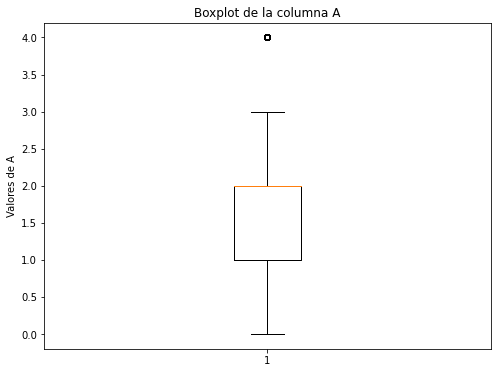

In [5]:
# Crear un boxplot para la columna 'A'
plt.figure(figsize=(8, 6))
plt.boxplot(x_positions)
plt.title('Boxplot de la columna A')
plt.ylabel('Valores de A')
plt.show()

In [6]:
# Extraer la primera posición sin modificar el DataFrame
x_positions_2 = df_mini['mouse_final'].apply(lambda x: str(x[0])+str(x[1]))
x_positions_3 = df_pov['mouse_final'].apply(lambda x: str(x[0])+str(x[1]))

# Sustituir la columna original
df_mini['mouse_final'] = x_positions_2
df_pov['mouse_final'] = x_positions_3

In [7]:
print(df_mini.shape)
print(df_pov.shape)

(1656, 6)
(1656, 6)


In [8]:
# Eliminamos datos sucios
df_pov = df_pov[(df_pov['mouse_final'] != "20") & (df_pov['mouse_final'] != "21") & (df_pov['mouse_final'] != "22")& (df_pov['mouse_final'] != "23")& (df_pov['mouse_final'] != "24")& (df_pov['mouse_final'] != "02")]
df_pov.reset_index(drop=True, inplace=True)

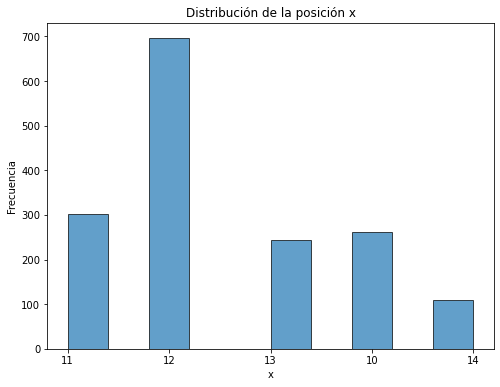

In [9]:
# Crear la figura y el eje
fig, ax = plt.subplots(figsize=(8, 6))

# Crear el histograma
ax.hist(df_pov['mouse_final'], bins=10, edgecolor='black', alpha=0.7)

# Agregar el título y las etiquetas de los ejes
ax.set_title('Distribución de la posición x')
ax.set_xlabel('x')
ax.set_ylabel('Frecuencia')

# Mostrar la figura
plt.show()

## One-Hot Encoding

In [10]:
# Crear un DataFrame con las columnas de one-hot encoding
one_hot_df = pd.get_dummies(df_mini['mouse_final'], prefix='label')

# Unir el DataFrame original con el DataFrame de one-hot encoding
df_mini = pd.concat([df_mini, one_hot_df], axis=1)

df_mini = df_mini.drop('mouse_final', axis=1)

In [11]:
# Crear un DataFrame con las columnas de one-hot encoding
one_hot_df = pd.get_dummies(df_pov['mouse_final'], prefix='label')

# Unir el DataFrame original con el DataFrame de one-hot encoding
df_pov = pd.concat([df_pov, one_hot_df], axis=1)

df_pov = df_pov.drop('mouse_final', axis=1)

## Lista con las etiquetas 

In [12]:
ETIQUETAS = np.array(df_pov.filter(like='label').columns.tolist())

In [13]:
ETIQUETAS

array(['label_10', 'label_11', 'label_12', 'label_13', 'label_14'],
      dtype='<U8')

## Visualizacion DataFrame

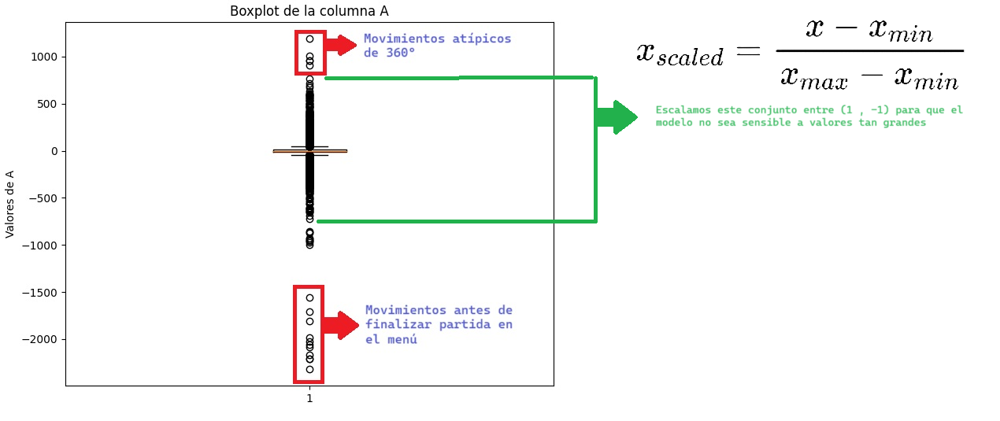

## Visualizacion Imagenes Dataset

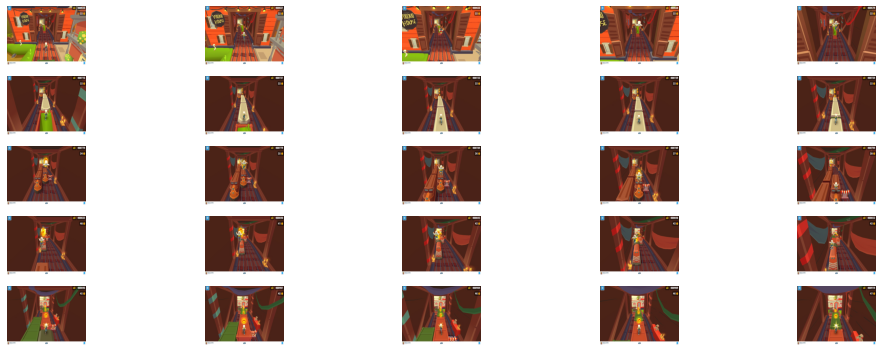

In [20]:
posicion_x = 10

fig, axes = plt.subplots(5, 5, figsize=(15, 5))

for i in range(5):
    for j in range(5):
        # Obtener la ruta de la imagen
        ruta_imagen = df_pov.iloc[(posicion_x+i), j]  # Elimina los corchetes

        # Abrir la imagen y convertirla a matriz numpy
        imagen = Image.open("../" + ruta_imagen)
        matriz_np = np.array(imagen)

        # Mostrar la imagen en el subplot correspondiente
        axes[i, j].imshow(matriz_np)
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()

Tamaño imagen -> (300, 225)
Tamaño matriz -> (225, 300, 3)


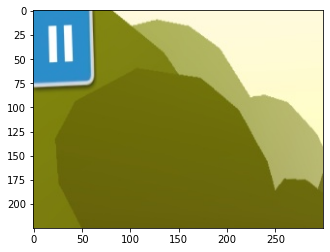

In [21]:
primera_fila = df_mini.iloc[0]
imagen = Image.open("../" +str(primera_fila.iloc[1]))
matriz_np = np.array(imagen)
print("Tamaño imagen -> "+str(imagen.size))
print("Tamaño matriz -> "+ str(matriz_np.shape))
plt.imshow(matriz_np)
plt.axis('on')
plt.show()

Tamaño imagen -> (600, 450)
Tamaño matriz -> (450, 600, 3)


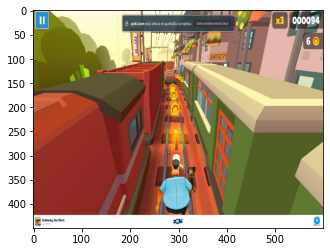

In [22]:
primera_fila = df_pov.iloc[0]
imagen = Image.open("../" +str(primera_fila.iloc[1]))
matriz_np = np.array(imagen)
print("Tamaño imagen -> "+str(imagen.size))
print("Tamaño matriz -> "+ str(matriz_np.shape))
plt.imshow(matriz_np)
plt.axis('on')
plt.show()

# Funcion Del Batch

In [14]:
from keras.utils import Sequence

class ImageDataGenerator(Sequence):
    def __init__(self, df , sequence_length ,image_height , image_width , batch_size, filtro, **kwargs):
        self.df = df
        self.image_sequence_length = sequence_length
        self.image_height = image_height
        self.image_width = image_width
        self.batch_size = batch_size
        self.filtro_SHARPEN = filtro
        super().__init__(**kwargs)  # Llamada al constructor de la clase base

    def __len__(self):
        return int(np.ceil(len(self.df) / float(self.batch_size)))

    def cargar_todo(self,fin_df):
        batch_df = self.df.iloc[0:fin_df]     #Obtenemos un lote del df

        X_batch = np.zeros((len(batch_df), self.image_sequence_length ,self.image_height, self.image_width, 3))  # Inicializar matriz para las imágenes
        #y_batch = batch_df[['izquieda', 'derecha', 'delante']].values
        y_batch = np.array(batch_df['mouse_final'].tolist())

        for i, (_, row) in enumerate(batch_df.iterrows()):
            frames = []
            for j in range(self.image_sequence_length):
                imagen = Image.open("../" + row.iloc[j])    # Obtener la ruta de la imagen
                imagen = Image.fromarray(np.array(imagen)).filter(ImageFilter.SHARPEN)  #Aplicamos Filtro SHARPEN
                imagen = np.array(imagen) / 255.0           # Normalizar la imagen

                frames.append(imagen)                  #Juntamos frames en lista
            video = np.stack(frames, axis=0)           # Convertir lista de frames en un video np
            X_batch[i] = video

        return X_batch, y_batch

    def __getitem__(self, index):
        inicio_lote = index * self.batch_size
        final_lote = (index + 1) * self.batch_size

        batch_df = self.df.iloc[inicio_lote:final_lote]     #Obtenemos un lote del df

        X_batch = np.zeros((len(batch_df), self.image_sequence_length ,self.image_height, self.image_width, 3))  # Inicializar matriz para las imágenes
        # Obtener y_batch después del one-hot encoding
        #y_batch = batch_df[['izquieda', 'derecha','delante']].values
        #y_batch = np.array(batch_df['mouse_final'].tolist())

        # Filtrar las columnas que comienzan con 'label'
        y_batch = batch_df.filter(like='label').values

        for i, (_, row) in enumerate(batch_df.iterrows()):
            frames = []
            for j in range(self.image_sequence_length):
                imagen = Image.open("../" + row.iloc[j])    # Obtener la ruta de la imagen
                imagen = Image.fromarray(np.array(imagen))

                if self.filtro_SHARPEN == True :
                    imagen = imagen.filter(ImageFilter.SHARPEN)  #Aplicamos Filtro SHARPEN

                imagen = np.array(imagen) / 255.0           # Normalizar la imagen

                frames.append(imagen)                  #Juntamos frames en lista
            video = np.stack(frames, axis=0)           # Convertir lista de frames en un video np
            X_batch[i] = video

        return X_batch, y_batch

def comprobar_contenido(X_train , Y_train , num_video):

    fig, axs = plt.subplots(1, 5, figsize=(5 * 2, 1 * 2))

    for i in range(5):
        axs[i].imshow(X_train[num_video][i])
        axs[i].axis('off')

    plt.tight_layout()
    plt.show()
    print(Y_train[num_video])
    return Y_train[num_video]

2024-08-09 19:58:58.700317: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-08-09 19:58:58.729692: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX512F AVX512_VNNI AVX512_BF16, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [29]:
class CombinedDataGenerator(Sequence):
    def __init__(self, generator_mapa, generator_pov):
        self.generator_mapa = generator_mapa
        self.generator_pov = generator_pov

    def __len__(self):
        return min(len(self.generator_mapa), len(self.generator_pov))

    def __getitem__(self, index):
        X_mapa, y_mapa = self.generator_mapa[index]
        X_pov, y_pov = self.generator_pov[index]

        # Asegurarse de que las etiquetas sean iguales
        assert np.array_equal(y_mapa, y_pov), "Las etiquetas no coinciden"

            # Pasamos los batch como lista de arrays de np
        return [X_mapa, X_pov], y_mapa  # o y_pov, ya que son iguales


    def __iter__(self):
        # Devolver un iterador que itera sobre los batches
        for i in range(len(self)):
            yield self[i]

    def on_epoch_end(self):
        self.generator_mapa.on_epoch_end()
        self.generator_pov.on_epoch_end()

# PREPARACIÒN ENTRENAMIENTO

## Train Split

In [60]:
# Modelo Mini-Mapa
X_train_Mapa, X_test_Mapa = train_test_split(df_mini, test_size=0.2, random_state=42)
X_train_Mapa, X_valid_Mapa = train_test_split(X_train_Mapa, test_size=0.25, random_state=42)

print("Tamaño total: ",len(df_mini))
print("Tamaño del conjunto de entrenamiento:", len(X_train_Mapa))
print("Tamaño del conjunto de prueba:", len(X_test_Mapa))
print("Tamaño del conjunto de validación:", len(X_valid_Mapa))

Tamaño total:  189
Tamaño del conjunto de entrenamiento: 113
Tamaño del conjunto de prueba: 38
Tamaño del conjunto de validación: 38


In [15]:
# Modelo POV
X_train_Pov, X_test_Pov = train_test_split(df_pov, test_size=0.2, random_state=42)
X_train_Pov, X_valid_Pov = train_test_split(X_train_Pov, test_size=0.25, random_state=42)

print("Tamaño total: ",len(df_pov))
print("Tamaño del conjunto de entrenamiento:", len(X_train_Pov))
print("Tamaño del conjunto de prueba:", len(X_test_Pov))
print("Tamaño del conjunto de validación:", len(X_valid_Pov))

Tamaño total:  1612
Tamaño del conjunto de entrenamiento: 966
Tamaño del conjunto de prueba: 323
Tamaño del conjunto de validación: 323


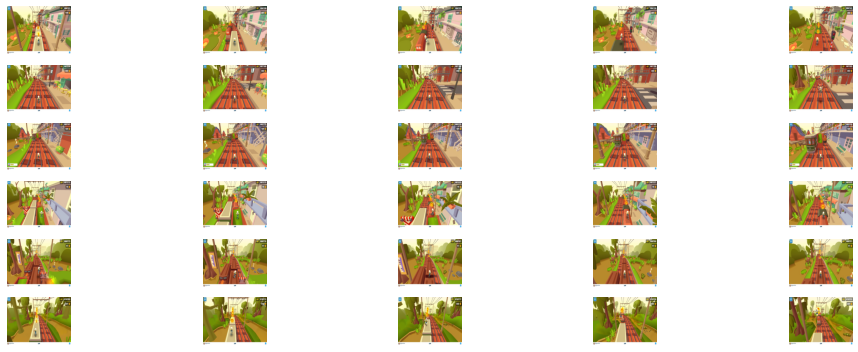

In [25]:
fig, axes = plt.subplots(6, 5, figsize=(15, 5))

for i in range(6):
    for j in range(5):
        # Obtener la ruta de la imagen
        ruta_imagen = X_test_Pov.iloc[i, j]  # Elimina los corchetes

        # Abrir la imagen y convertirla a matriz numpy
        imagen = Image.open("../" + ruta_imagen)
        matriz_np = np.array(imagen)

        # Mostrar la imagen en el subplot correspondiente
        axes[i, j].imshow(matriz_np)
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()

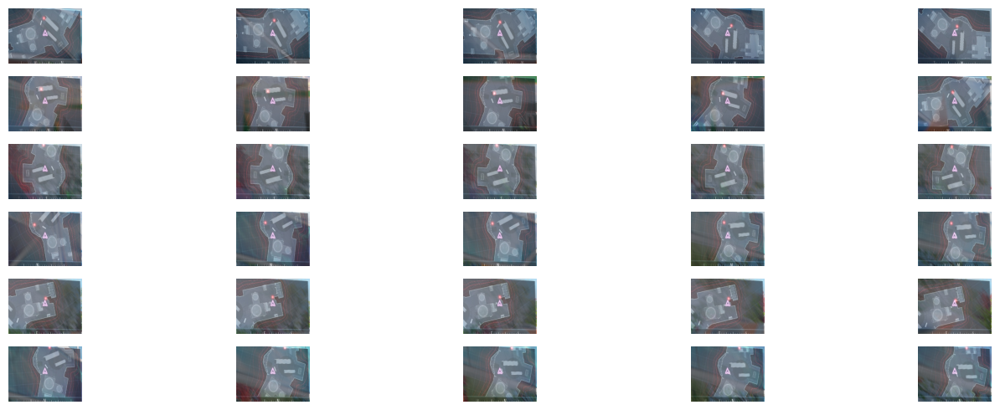

In [25]:
fig, axes = plt.subplots(6, 5, figsize=(15, 5))

for i in range(6):
    for j in range(5):
        # Obtener la ruta de la imagen
        ruta_imagen = X_test_Mapa.iloc[i, j]  # Elimina los corchetes

        # Abrir la imagen y convertirla a matriz numpy
        imagen = Image.open("../" + ruta_imagen)
        matriz_np = np.array(imagen)

        # Mostrar la imagen en el subplot correspondiente
        axes[i, j].imshow(matriz_np)
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()

# Generadores

In [16]:
BATCH = 3

In [48]:
# Generador Mapa
altura_img_mini = 225
anchura_img_mini = 300
batch_size = BATCH #videos por batch

# Generadores de Batches Mini-Mapa
train_generator_Mapa = ImageDataGenerator(X_train_Mapa, sequence_length=5, image_height=altura_img_mini, image_width=anchura_img_mini, batch_size=batch_size ,filtro =True)
test_generator_Mapa = ImageDataGenerator(X_test_Mapa, sequence_length=5, image_height=altura_img_mini, image_width=anchura_img_mini, batch_size=batch_size ,filtro =True)
valid_generator_Mapa = ImageDataGenerator(X_valid_Mapa, sequence_length=5, image_height=altura_img_mini, image_width=anchura_img_mini, batch_size=batch_size ,filtro =True)

1


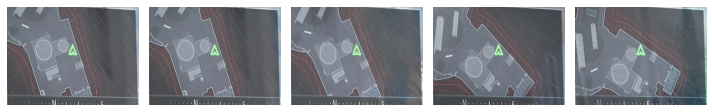

[1 0 0 0 0 0 0]
label_02


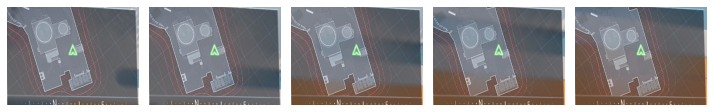

[0 1 0 0 0 0 0]
label_10


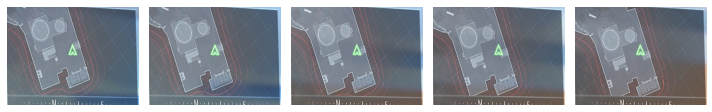

[1 0 0 0 0 0 0]
label_02


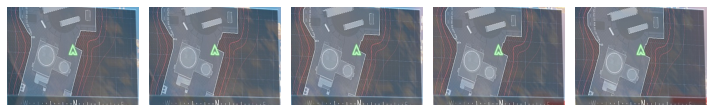

[0 1 0 0 0 0 0]
label_10


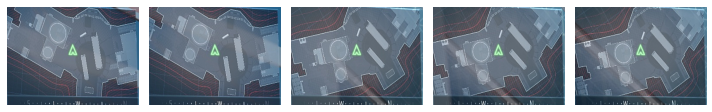

[0 0 0 0 0 1 0]
label_30


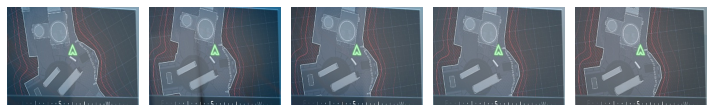

[0 0 1 0 0 0 0]
label_11


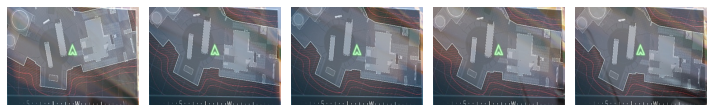

[0 1 0 0 0 0 0]
label_10


In [49]:
#Cantidad de batches en los que se divide el df
print(test_generator_Mapa.__len__())

#Comprobamos funcionamiento bach
X_batch, y_batch = test_generator_Mapa.__getitem__(0)

for i in range(0,batch_size):  # 4 es el maximo de conjunto de imagenes del batch creado
    # Seleccionamos ver la posicion numero 0 del batch creado
    label = comprobar_contenido(X_batch , y_batch,i)
    print(ETIQUETAS[np.argmax(label)])  #Obtener la columna de la etiqueta original


20


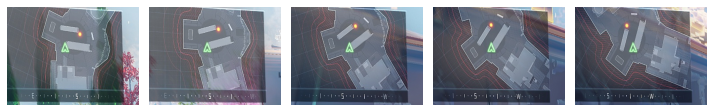

[4 1 0]


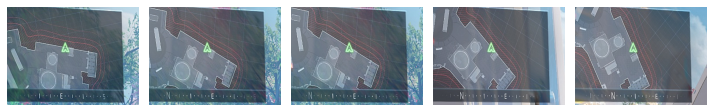

[4 0 0]


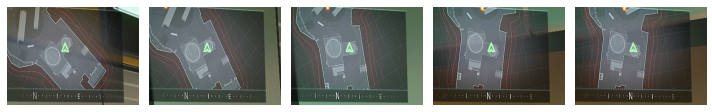

[4 0 0]


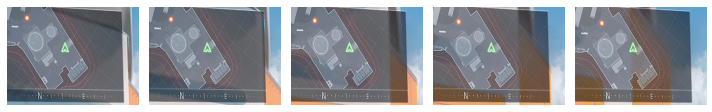

[0 2 0]


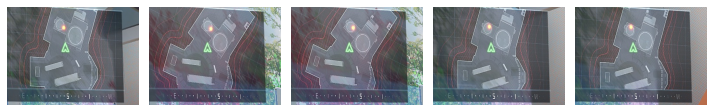

[2 1 0]


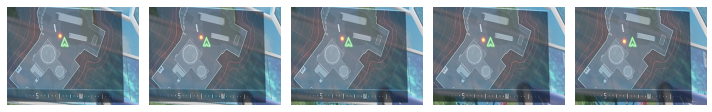

[0 2 0]


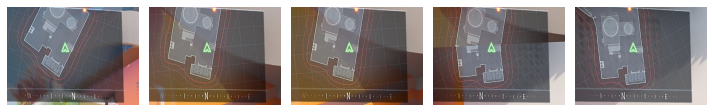

[2 1 0]


In [43]:
#Cantidad de batches en los que se divide el df
print(train_generator_Mapa.__len__())

#Comprobamos funcionamiento bach
X_batch, y_batch = train_generator_Mapa.__getitem__(2)

for i in range(0,batch_size):  # 4 es el maximo de conjunto de imagenes del batch creado
    # Seleccionamos ver la posicion numero 0 del batch creado
    comprobar_contenido(X_batch , y_batch,i)

In [17]:
# Generador Pov
#altura_img_mini = 225
#anchura_img_mini = 300

altura_img_mini = 450
anchura_img_mini = 600
batch_size = BATCH #videos por batch

# Generadores de Batches Pov
train_generator_Pov = ImageDataGenerator(X_train_Pov, sequence_length=5, image_height=altura_img_mini, image_width=anchura_img_mini, batch_size=batch_size ,filtro =True)
test_generator_Pov = ImageDataGenerator(X_test_Pov, sequence_length=5, image_height=altura_img_mini, image_width=anchura_img_mini, batch_size=batch_size ,filtro =True)
valid_generator_Pov = ImageDataGenerator(X_valid_Pov, sequence_length=5, image_height=altura_img_mini, image_width=anchura_img_mini, batch_size=batch_size ,filtro =True)

194


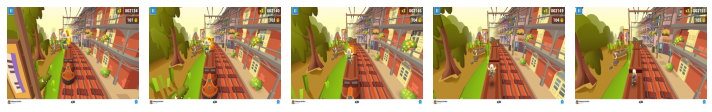

[0 1 0 0 0]
label_11


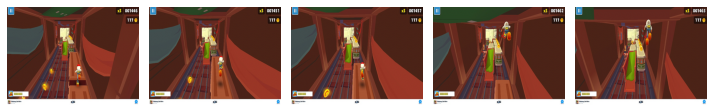

[0 0 1 0 0]
label_12


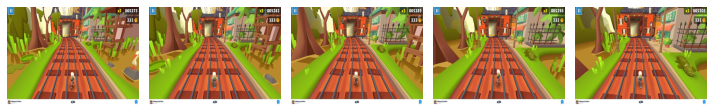

[0 0 1 0 0]
label_12


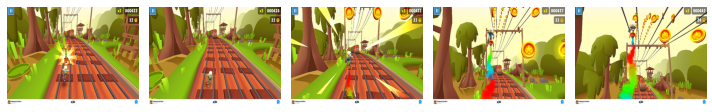

[0 0 1 0 0]
label_12


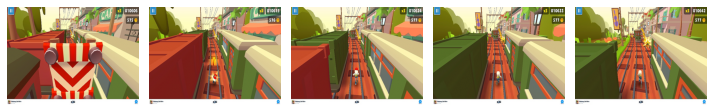

[0 0 0 1 0]
label_13


In [19]:
#Cantidad de batches en los que se divide el df
print(train_generator_Pov.__len__())

#Comprobamos funcionamiento bach
X_batch, y_batch = train_generator_Pov.__getitem__(6)

for i in range(0,batch_size):  # 2 es el maximo de conjunto de imagenes del batch creado
    # Seleccionamos ver la posicion numero 0 del batch creado
    label = comprobar_contenido(X_batch , y_batch,i)
    print(ETIQUETAS[np.argmax(label)])  #Obtener la columna de la etiqueta original

# Modelo - Entreno

In [18]:
from tensorflow.keras.models import Model 
#from keras.layers import Input, ConvLSTM2D, TimeDistributed, BatchNormalization,MaxPooling2D, Dropout, Conv3D, MaxPooling3D, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping ,ReduceLROnPlateau,ModelCheckpoint
from tensorflow.keras.regularizers import l2

In [19]:
from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetV2B0

def creacion_modelo_EfficientNet(input_shape_pov):

    # Entrada única para la secuencia de frames
    input = layers.Input(shape=input_shape_pov)

    # Reshape para procesar cada imagen individualmente
    reshaped_input = layers.TimeDistributed(layers.InputLayer(input_shape=input_shape_pov[1:]))(input)

    # Capa base de EfficientNetV2B0 aplicada a cada imagen de la secuencia.
    base_model = EfficientNetV2B0(include_top=False, weights='imagenet',input_shape=input_shape_pov[1:])
    # Congelamos las capas de EfficientNetV2B0 para no entrenarlas.
    base_model.trainable = True

    # Aplicar la EfficientNetV2B0 a cada imagen de la secuencia.
    layer_time = layers.TimeDistributed(base_model)(reshaped_input)
    # Aplanar la salida de la EfficientNetV2B0.
    layer_pool = layers.TimeDistributed(layers.GlobalAveragePooling2D())(layer_time)

    # Capa LSTM
    lstm01 = layers.LSTM(128 , return_sequences=True)(layer_pool)
    lstm02 = layers.LSTM(64)(lstm01)  # Puedes ajustar el número de unidades

    # Capas Densa (puedes ajustar el número de unidades y dropout)
    dense_out_02 = layers.Dense(448, activation='relu')(lstm02)
    drop_dense_02 = layers.Dropout((0.5))(dense_out_02)

    # Capas Densa (puedes ajustar el número de unidades y dropout)
    dense_out_03 = layers.Dense(200, activation='relu')(drop_dense_02)
    drop_dense_03 = layers.Dropout((0.5))(dense_out_03)

    # Capa Salida
    output = layers.Dense(len(ETIQUETAS), activation='softmax')(drop_dense_03)

    # Definir el modelo
    model = models.Model(inputs=input, outputs=output)

    return model

In [21]:
from keras.layers import Input, TimeDistributed ,Conv2D, LSTM, BatchNormalization,MaxPooling2D, Dropout, Flatten, Dense ,Concatenate


def creacion_modelo_convLSTM(input_shape_mapa , input_shape_pov):

    # Entrada única para la secuencia de frames
    input_shape = Input(shape=input_shape_mapa)
    input_shape_pov = Input(shape=input_shape_pov)

    #-----------Mini_mapa--------------------

    # Capas Conv2D
    conv2d = TimeDistributed(Conv2D(32, (3, 3), activation='relu', padding='same'))(input_shape)
    batchnorm_layer = TimeDistributed(BatchNormalization())(conv2d)
    maxpool_layer = TimeDistributed(MaxPooling2D(pool_size=(2, 2)))(batchnorm_layer)
    dropout_mapa_01 = TimeDistributed(Dropout(0.2))(maxpool_layer)

    conv2d02 = TimeDistributed(Conv2D(64, (3, 3), activation='relu', padding='same'))(dropout_mapa_01)
    batchnorm_layer_02 = TimeDistributed(BatchNormalization())(conv2d02)
    maxpool_layer_02 = TimeDistributed(MaxPooling2D(pool_size=(2, 2)))(batchnorm_layer_02)
    dropout_mapa_02 = TimeDistributed(Dropout(0.2))(maxpool_layer_02)

    conv2d03 = TimeDistributed(Conv2D(128, (3, 3), activation='relu', padding='same'))(dropout_mapa_02)
    batchnorm_layer_03 = TimeDistributed(BatchNormalization())(conv2d03)
    maxpool_layer_03 = TimeDistributed(MaxPooling2D(pool_size=(2, 2)))(batchnorm_layer_03)
    dropout_mapa_03 = TimeDistributed(Dropout(0.2))(maxpool_layer_03)

    conv2d04 = TimeDistributed(Conv2D(245, (3, 3), activation='relu', padding='same'))(dropout_mapa_03)
    batchnorm_layer_04 = TimeDistributed(BatchNormalization())(conv2d04)
    maxpool_layer_04 = TimeDistributed(MaxPooling2D(pool_size=(2, 2)))(batchnorm_layer_04)
    dropout_mapa_04 = TimeDistributed(Dropout(0.2))(maxpool_layer_04)


    flat1 = TimeDistributed(Flatten())(dropout_mapa_04)


    # Capa LSTM
    lstm01 = LSTM(128 , return_sequences=True)(flat1)
    lstm02 = LSTM(64)(lstm01)  # Puedes ajustar el número de unidades

    # Capas Densa (puedes ajustar el número de unidades y dropout)
    dense_out_02 = Dense(448, activation='relu')(lstm02)
    drop_dense_02 = Dropout((0.5))(dense_out_02)

    # Capas Densa (puedes ajustar el número de unidades y dropout)
    dense_out_03 = Dense(448, activation='relu')(drop_dense_02)
    drop_dense_03 = Dropout((0.5))(dense_out_03)

    # Capa Salida
    output = Dense(3, activation='softmax')(drop_dense_03)

    model = Model(inputs=[input_shape, input_shape_pov], outputs=output)

    return model

In [26]:
from keras.layers import Input, TimeDistributed ,Conv2D, LSTM, BatchNormalization,MaxPooling2D, Dropout, Flatten, Dense ,Concatenate


def creacion_modelo_convLSTM(input_shape_mapa , input_shape_pov):

    # Entrada única para la secuencia de frames
    input_shape = Input(shape=input_shape_mapa)
    input_shape_pov = Input(shape=input_shape_pov)

    #-----------Mini_mapa--------------------

    # Capas Conv2D
    conv2d = TimeDistributed(Conv2D(32, (3, 3), activation='relu', padding='same'))(input_shape)
    batchnorm_layer = TimeDistributed(BatchNormalization())(conv2d)
    maxpool_layer = TimeDistributed(MaxPooling2D(pool_size=(2, 2)))(batchnorm_layer)
    dropout_mapa_01 = TimeDistributed(Dropout(0.2))(maxpool_layer)

    conv2d02 = TimeDistributed(Conv2D(64, (3, 3), activation='relu', padding='same'))(dropout_mapa_01)
    batchnorm_layer_02 = TimeDistributed(BatchNormalization())(conv2d02)
    maxpool_layer_02 = TimeDistributed(MaxPooling2D(pool_size=(2, 2)))(batchnorm_layer_02)
    dropout_mapa_02 = TimeDistributed(Dropout(0.2))(maxpool_layer_02)

    conv2d03 = TimeDistributed(Conv2D(128, (3, 3), activation='relu', padding='same'))(dropout_mapa_02)
    batchnorm_layer_03 = TimeDistributed(BatchNormalization())(conv2d03)
    maxpool_layer_03 = TimeDistributed(MaxPooling2D(pool_size=(2, 2)))(batchnorm_layer_03)
    dropout_mapa_03 = TimeDistributed(Dropout(0.2))(maxpool_layer_03)

    conv2d04 = TimeDistributed(Conv2D(245, (3, 3), activation='relu', padding='same'))(dropout_mapa_03)
    batchnorm_layer_04 = TimeDistributed(BatchNormalization())(conv2d04)
    maxpool_layer_04 = TimeDistributed(MaxPooling2D(pool_size=(2, 2)))(batchnorm_layer_04)
    dropout_mapa_04 = TimeDistributed(Dropout(0.2))(maxpool_layer_04)

    #-----------Pov--------------------

    # Capas Conv2D
    conv2d_pov = TimeDistributed(Conv2D(32, (3, 3), activation='relu', padding='same'))(input_shape_pov)
    batchnorm_layer_pov = TimeDistributed(BatchNormalization())(conv2d_pov)
    maxpool_layer_pov = TimeDistributed(MaxPooling2D(pool_size=(2, 2)))(batchnorm_layer_pov)
    dropout_mapa_01_pov = TimeDistributed(Dropout(0.2))(maxpool_layer_pov)

    conv2d02_pov = TimeDistributed(Conv2D(64, (3, 3), activation='relu', padding='same'))(dropout_mapa_01_pov)
    batchnorm_layer_02_pov = TimeDistributed(BatchNormalization())(conv2d02_pov)
    maxpool_layer_02_pov = TimeDistributed(MaxPooling2D(pool_size=(2, 2)))(batchnorm_layer_02_pov)
    dropout_mapa_02_pov = TimeDistributed(Dropout(0.2))(maxpool_layer_02_pov)

    flat1 = TimeDistributed(Flatten())(dropout_mapa_04)
    flat2 = TimeDistributed(Flatten())(dropout_mapa_02_pov)

    # Concatenar las características aplanadas
    merged_features = Concatenate()([flat1, flat2])

    # Capa LSTM
    lstm01 = LSTM(128 , return_sequences=True)(merged_features)
    lstm02 = LSTM(64)(lstm01)  # Puedes ajustar el número de unidades

    # Capas Densa (puedes ajustar el número de unidades y dropout)
    dense_out_02 = Dense(448, activation='relu')(lstm02)
    drop_dense_02 = Dropout((0.5))(dense_out_02)

    # Capa Salida
    output = Dense(3, activation='softmax')(drop_dense_02)

    model = Model(inputs=[input_shape, input_shape_pov], outputs=output)

    return model

In [ ]:
timesteps = 5
height = 225
width = 300
channels = 3
input_shape_mapa = (timesteps, height, width, channels) # Modelo Mini-Mapa
input_shape_pov = (timesteps, height, width, channels) # Modelo Pov

model = creacion_modelo_convLSTM(input_shape_mapa,input_shape_pov)

In [20]:
timesteps = 5
height = 450
width = 600
channels = 3

input_shape_pov = (timesteps, height, width, channels) # Modelo Pov

model = creacion_modelo_EfficientNet(input_shape_pov)

2024-08-09 20:00:10.540696: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-08-09 20:00:10.573987: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-08-09 20:00:10.574199: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

## Callbacks

In [21]:
# Compilar el modelo
model.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['categorical_accuracy'])

#Callbacks
early_stopping = EarlyStopping(monitor= 'val_categorical_accuracy', patience=20, verbose=1, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('modelo_merge_checkpoint.h5',monitor='val_categorical_accuracy',save_best_only=True,verbose=1)
'''
reduce_lr = ReduceLROnPlateau(  monitor='val_categorical_accuracy',
                                factor=0.2,
                                patience=5,
                                min_lr=0.00001,
                                verbose=1)
'''

"\nreduce_lr = ReduceLROnPlateau(  monitor='val_categorical_accuracy',\n                                factor=0.2,\n                                patience=5,\n                                min_lr=0.00001,\n                                verbose=1)\n"

In [22]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 5, 450, 600, 3)   0         
                             ]                                   
                                                                 
 time_distributed (TimeDist  (None, 5, 450, 600, 3)    0         
 ributed)                                                        
                                                                 
 time_distributed_1 (TimeDi  (None, 5, 15, 19, 1280)   5919312   
 stributed)                                                      
                                                                 
 time_distributed_2 (TimeDi  (None, 5, 1280)           0         
 stributed)                                                      
                                                                 
 lstm (LSTM)                 (None, 5, 128)            721408

In [25]:
# Crear una instancia del generador combinado
combined_generator = CombinedDataGenerator(train_generator_Mapa, train_generator_Pov)
# Crear una instancia del generador combinado
valid_combine_generator = CombinedDataGenerator(valid_generator_Mapa, valid_generator_Pov)

In [31]:
imagenes , label = combined_generator.__getitem__(10)

-------------0-------------


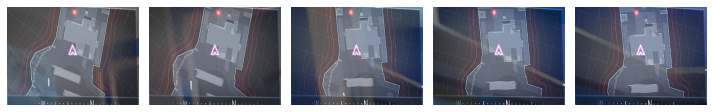

[0. 0. 1.]


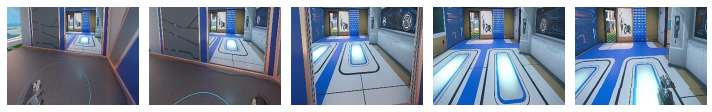

[0. 0. 1.]
-------------1-------------


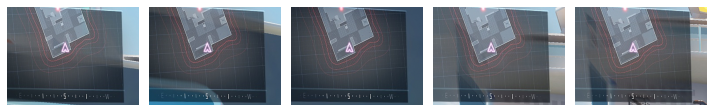

[0. 0. 1.]


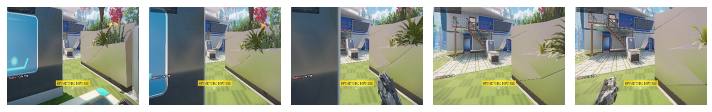

[0. 0. 1.]
-------------2-------------


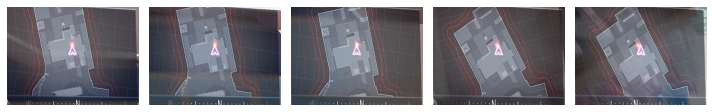

[0. 1. 0.]


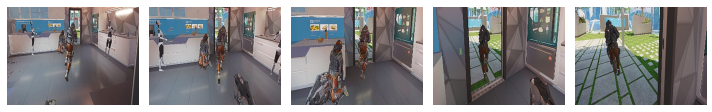

[0. 1. 0.]


In [32]:
for i in range(0,batch_size):  # 2 es el maximo de conjunto de imagenes del batch creado
    print("-------------"+str(i)+"-------------")
    # Seleccionamos ver la posicion numero 0 del batch creado
    comprobar_contenido(imagenes[0] , label,i)
    comprobar_contenido(imagenes[1] , label,i)

In [23]:
import time

# Registro del tiempo de inicio
start_time = time.time()

# Entrenamiento Mini-Mapa
history = model.fit(train_generator_Pov, epochs=1000, validation_data=valid_generator_Pov, callbacks=[early_stopping,model_checkpoint])

model.save('modelo_merge_subway.h5')

# Registro del tiempo de finalización
end_time = time.time()

Epoch 1/1000


2024-08-09 20:00:42.175747: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/time_distributed_1/efficientnetv2-b0/block2b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-08-09 20:00:43.516167: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8907
2024-08-09 20:00:44.753491: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x5e01eedba250 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-08-09 20:00:44.753511: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce GTX 1070, Compute Capability 6.1
2024-08-09 20:00:44.756374: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:255] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-08-09 20:00:44.821541: I ./tensorflow/com

322/322 [==============================] - ETA: 0s - loss: 1.4832 - categorical_accuracy: 0.4286

2024-08-09 20:04:35.924432: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.98GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.



Epoch 1: val_categorical_accuracy improved from -inf to 0.40248, saving model to modelo_merge_checkpoint.h5


/usr/lib/python3/dist-packages/keras/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


322/322 [==============================] - 258s 736ms/step - loss: 1.4832 - categorical_accuracy: 0.4286 - val_loss: 1.4943 - val_categorical_accuracy: 0.4025
Epoch 2/1000
322/322 [==============================] - ETA: 0s - loss: 1.4789 - categorical_accuracy: 0.4389
Epoch 2: val_categorical_accuracy did not improve from 0.40248
322/322 [==============================] - 233s 723ms/step - loss: 1.4789 - categorical_accuracy: 0.4389 - val_loss: 1.4682 - val_categorical_accuracy: 0.4025
Epoch 3/1000
322/322 [==============================] - ETA: 0s - loss: 1.4559 - categorical_accuracy: 0.4400
Epoch 3: val_categorical_accuracy did not improve from 0.40248
322/322 [==============================] - 233s 725ms/step - loss: 1.4559 - categorical_accuracy: 0.4400 - val_loss: 1.4690 - val_categorical_accuracy: 0.4025
Epoch 4/1000
322/322 [==============================] - ETA: 0s - loss: 1.4569 - categorical_accuracy: 0.4400
Epoch 4: val_categorical_accuracy did not improve from 0.40248
322/

KeyboardInterrupt: 

In [26]:
import time

# Registro del tiempo de inicio
start_time = time.time()

# Entrenamiento Mini-Mapa
history = model.fit(combined_generator, epochs=1000, validation_data=valid_combine_generator, callbacks=[early_stopping,model_checkpoint])

model.save('modelo_merge.h5')

# Registro del tiempo de finalización
end_time = time.time()

Epoch 1/1000


2024-07-13 07:49:15.353959: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8907
2024-07-13 07:49:17.996955: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x73aa989c37d0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-07-13 07:49:17.996974: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce GTX 1070, Compute Capability 6.1
2024-07-13 07:49:18.465883: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:255] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-07-13 07:49:20.488628: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


504/504 [==============================] - ETA: 0s - loss: 1.0620 - categorical_accuracy: 0.3941
Epoch 1: val_categorical_accuracy improved from -inf to 0.42760, saving model to modelo_merge_checkpoint.h5


/usr/lib/python3/dist-packages/keras/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


504/504 [==============================] - 137s 253ms/step - loss: 1.0620 - categorical_accuracy: 0.3941 - val_loss: 1.0238 - val_categorical_accuracy: 0.4276
Epoch 2/1000
504/504 [==============================] - ETA: 0s - loss: 1.0452 - categorical_accuracy: 0.4248
Epoch 2: val_categorical_accuracy did not improve from 0.42760
504/504 [==============================] - 120s 238ms/step - loss: 1.0452 - categorical_accuracy: 0.4248 - val_loss: 1.0195 - val_categorical_accuracy: 0.4191
Epoch 3/1000
504/504 [==============================] - ETA: 0s - loss: 1.0232 - categorical_accuracy: 0.4364
Epoch 3: val_categorical_accuracy improved from 0.42760 to 0.44378, saving model to modelo_merge_checkpoint.h5
504/504 [==============================] - 126s 249ms/step - loss: 1.0232 - categorical_accuracy: 0.4364 - val_loss: 1.0064 - val_categorical_accuracy: 0.4438
Epoch 4/1000
504/504 [==============================] - ETA: 0s - loss: 1.0054 - categorical_accuracy: 0.4673
Epoch 4: val_catego

In [27]:
# Calcula la diferencia de tiempo en segundos
training_time_seconds = end_time - start_time

# Convierte el tiempo de entrenamiento a horas
training_time_hours = training_time_seconds / 3600  # 3600 segundos en una hora

# Imprime el tiempo de entrenamiento en horas
print(f"El entrenamiento duró aproximadamente {training_time_hours:.2f} horas.")

El entrenamiento duró aproximadamente 3.52 horas.


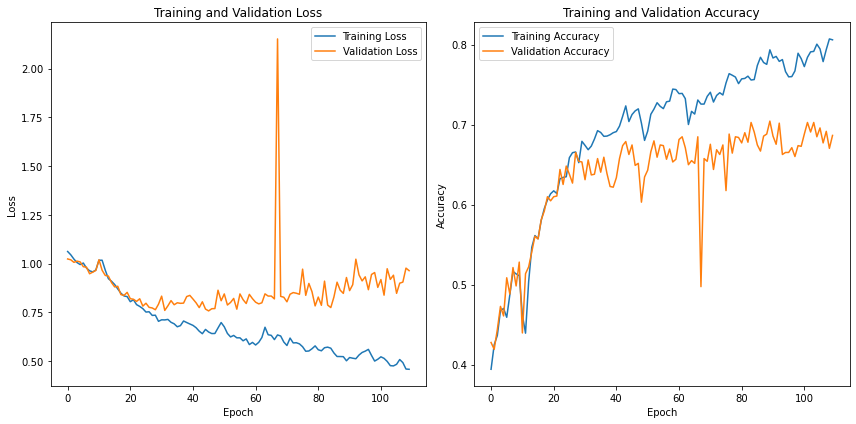

In [28]:
# Extrae la información de la historia
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['categorical_accuracy']
val_accuracy = history.history['val_categorical_accuracy']

# Crea subgráficos para la pérdida y la precisión
plt.figure(figsize=(12, 6))

# Gráfico de pérdida
plt.subplot(1, 2, 1)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Gráfico de precisión
plt.subplot(1, 2, 2)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Ajusta el diseño de los subgráficos
plt.tight_layout()

# Muestra los gráficos
plt.show()

In [29]:
# Crear una instancia del generador combinado
test_generator = CombinedDataGenerator(test_generator_Mapa, test_generator_Pov)

-------------0-------------


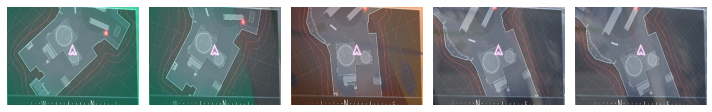

[0. 1.]


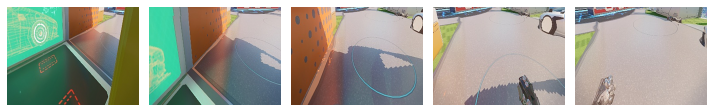

[0. 1.]
-------------1-------------


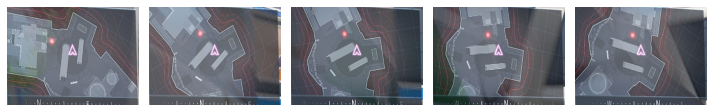

[1. 0.]


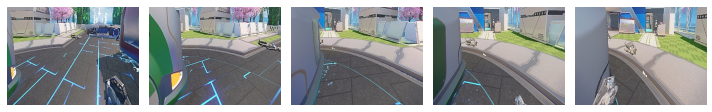

[1. 0.]
-------------2-------------


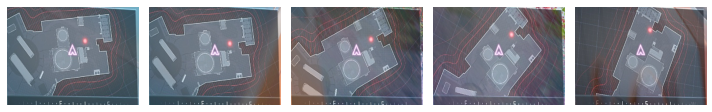

[0. 1.]


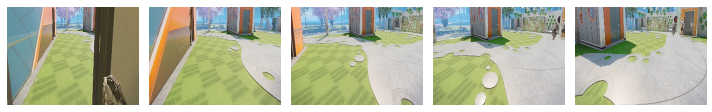

[0. 1.]
-------------3-------------


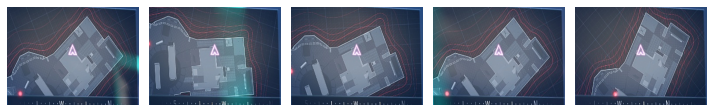

[1. 0.]


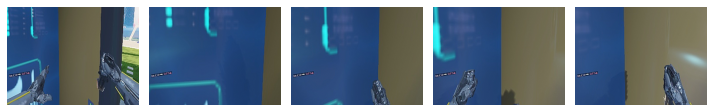

[1. 0.]
-------------4-------------


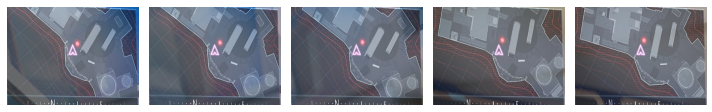

[0. 1.]


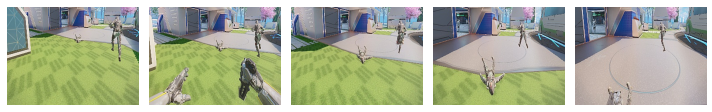

[0. 1.]


In [37]:
imagenes , label = test_generator.__getitem__(0)

for i in range(0,batch_size):  # 2 es el maximo de conjunto de imagenes del batch creado
    print("-------------"+str(i)+"-------------")
    # Seleccionamos ver la posicion numero 0 del batch creado
    comprobar_contenido(imagenes[0] , label,i)
    comprobar_contenido(imagenes[1] , label,i)

In [30]:
resultado = model.evaluate(test_generator)

168/168 [==============================] - 26s 154ms/step - loss: 0.7991 - categorical_accuracy: 0.6848


In [32]:
resultado

[0.799055278301239, 0.6848381757736206]

## Ver como se comporta el modelo

In [33]:
from sklearn.metrics import f1_score,confusion_matrix

valores_originales = X_test_Pov[['izquieda','derecha','delante']].copy()
valores_originales.reset_index(drop=True, inplace=True)

In [34]:
valores_originales

,izquieda,derecha,delante
0,0.0,0.0,1.0
1,1.0,0.0,0.0
2,0.0,0.0,1.0
3,0.0,0.0,1.0
4,1.0,0.0,0.0
...,...,...,...
1169,0.0,1.0,0.0
1170,0.0,0.0,1.0
1171,0.0,0.0,1.0
1172,1.0,0.0,0.0


In [35]:
# Generar predicciones en el conjunto de prueba
predictions = model.predict(test_generator)

168/168 [==============================] - 26s 154ms/step


In [36]:
predictions

array([[0.6487025 , 0.02500022, 0.32629725],
       [0.84239745, 0.00189663, 0.15570588],
       [0.08257192, 0.36872178, 0.5487063 ],
       ...,
       [0.06851462, 0.7102393 , 0.22124615],
       [0.62729305, 0.00598812, 0.3667189 ],
       [0.15471026, 0.16159031, 0.6836994 ]], dtype=float32)

In [37]:
# Convertir las probabilidades a etiquetas de clase
predicted_classes = np.argmax(predictions, axis=1)

#Convertimos las etiquetas one  hot a numeros
true_classes = np.argmax(valores_originales.values, axis=1)

In [38]:
predicted_classes

array([0, 0, 2, ..., 1, 0, 2])

In [39]:
true_classes

array([2, 0, 2, ..., 2, 0, 1])

In [40]:
# Calcular el F1 Score
f1 = f1_score(true_classes, predicted_classes, average='weighted')
print('F1 Score:', f1)

F1 Score: 0.6874020661558928


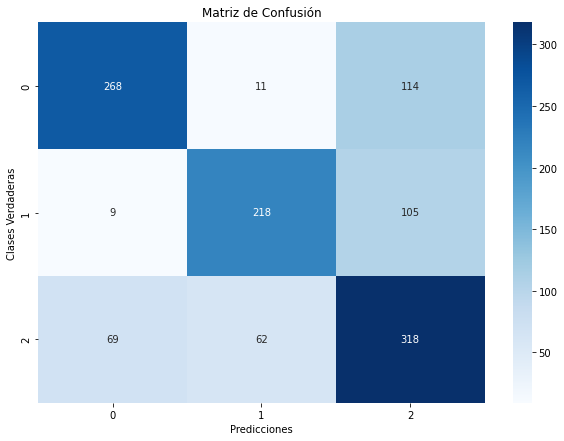

In [41]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Calcular la matriz de confusión
cm = confusion_matrix(true_classes, predicted_classes)

# Crear un gráfico de la matriz de confusión
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')

# Añadir etiquetas y título
plt.xlabel('Predicciones')
plt.ylabel('Clases Verdaderas')
plt.title('Matriz de Confusión')

# Mostrar el gráfico
plt.show()

## Resultatado Entrenamientos

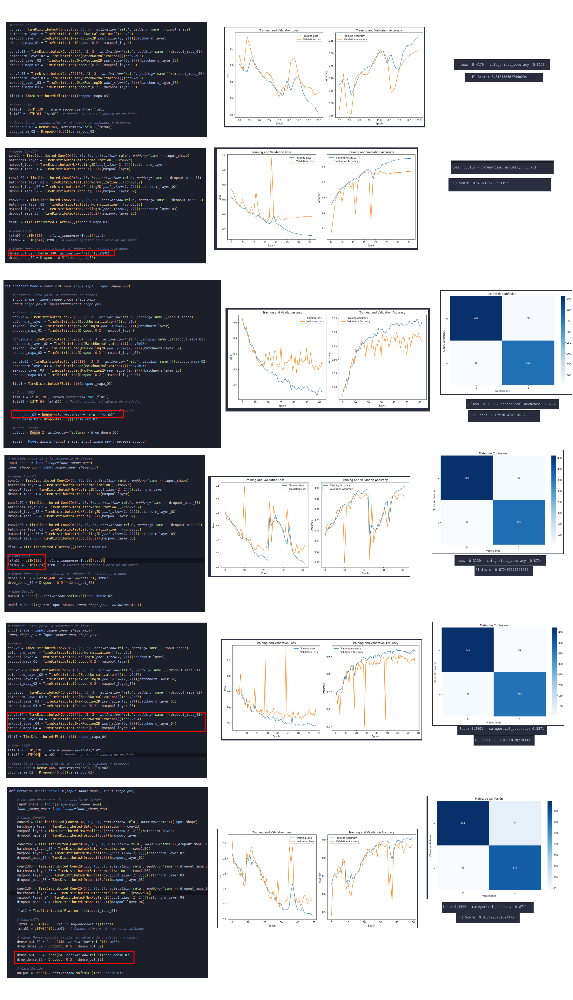